In [5]:
import sys
sys.path.insert(0, '..')
from motif_learning import MotifLearner
import mat73
import numpy as np
import matplotlib.pyplot as plt
import requests

# Zinc finger dataset

In [34]:
### data from https://www.ncbi.nlm.nih.gov/protein/CAA50632.1?report=fasta
zinc_finger_data = 'MLENYQNLLALGPPLHKPDVISHLERGEEPWSMQREVPRGPCPEWELKAVPSQQQGICKEEPAQEPIMERPLGGAQAWGRQAGALQRSQAAPGRRTCHGLGRPVEEFPLRCPLFAQQRVPEGGPLLDTRKNVQATEGRTKAPARLCAGENASTPSEPEKFPQVRRQRGAGAGEGEFVCGECGKAFRQSSSLTLHRRWHSREKAYKCDECGKAFTWSTNLLEHRRIHTGEKPFFCGECGKAFSCHSSLNVHQRIHTGERPYKCSACEKAFSCSSLLSMHLRVHTGEKPYRCGECGKAFNQRTHLTRHHRIHTGEKPYQCGSCGKAFTCHSSLTVHEKIHSGDKPFKCSDCEKAFNSRSRLTLHQRTHTGEKPFKCADCGKGFSCHAYLLVHRRIHSGEKPFKCNECGKAFSSHAYLIVHRRIHTGEKPFDCSQCWKAFSCHSSLIMHQRIHTGEKPYKCSECGRAFSQNHCLIKHQKIHSGEKSFKCEKCGEMFNWSSHLTEHQRLHSEGKPLAIQFNKHLLSTYYVPGSLLGAGDAGLRDVDPIDALDVAKLLCVVPPRAGRNFSLGSKPRN'


{0: 'G',
 1: 'D',
 2: 'C',
 3: 'Y',
 4: 'E',
 5: 'K',
 6: 'A',
 7: 'H',
 8: 'N',
 9: 'T',
 10: 'R',
 11: 'F',
 12: 'Q',
 13: 'V',
 14: 'S',
 15: 'L',
 16: 'I',
 17: 'W',
 18: 'M',
 19: 'P'}

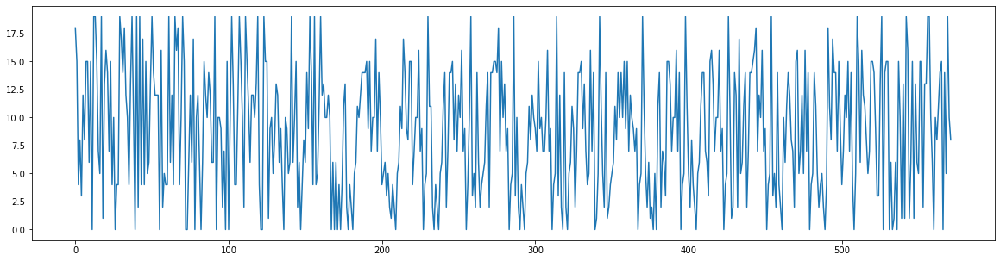

In [46]:
### Pre-processing
transl = {i:n for n,i in enumerate(set([i for i in zinc_finger_data]))}
inv_transl = {v:k for k, v in transl.items()}
dataset = [transl[i] for i in zinc_finger_data]
plt.figure(figsize=(20,5))
plt.plot(dataset)

## Motif learning

In [60]:
motifl = MotifLearner(sim_thresh=1, freq_thresh=3, l_motif_range=[3,15])
motifl.fit(dataset)
motif_list = motifl.get_motifs()
for motif in motif_list:
    print("".join([inv_transl[i] for i in motif]))

KAF
SSL
HRR
HQR
CGK
RIH
ECG
AFS
GEK
FKC
CGE
GEKP
CGKAF
ECGKAF
HTGEKP
RIHTGE


## Visualising motifs with interactive plot

In [62]:
motifl.matrix_plot()

interactive(children=(IntSlider(value=9, description='l_motif', max=15, min=3), Output()), _dom_classes=('widg…

## Analysis of how the motifs compose, and pruning

In [63]:
motif_comp_mtx, pruned_motif_list = motifl.motif_composition_analysis()

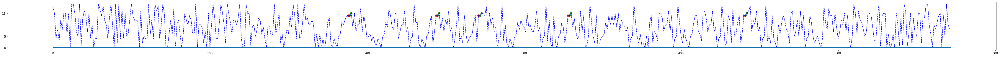

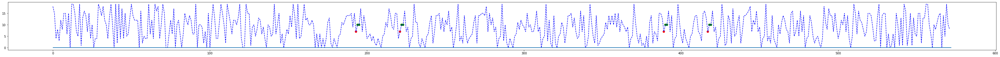

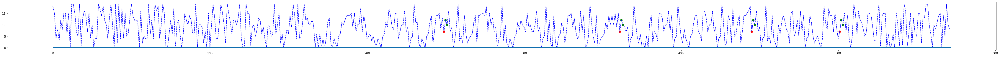

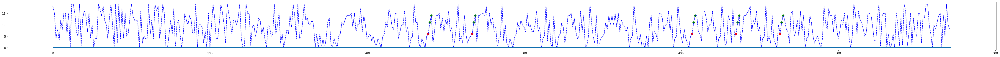

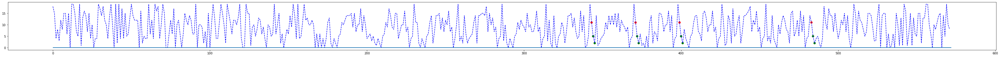

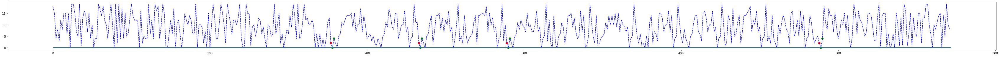

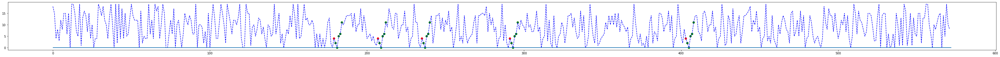

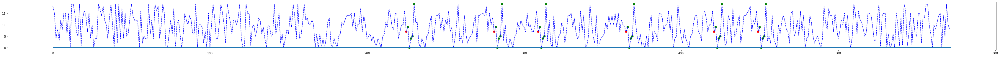

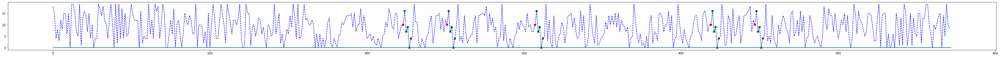

In [64]:
motifl.plot_motif_appearances(pruned=True)

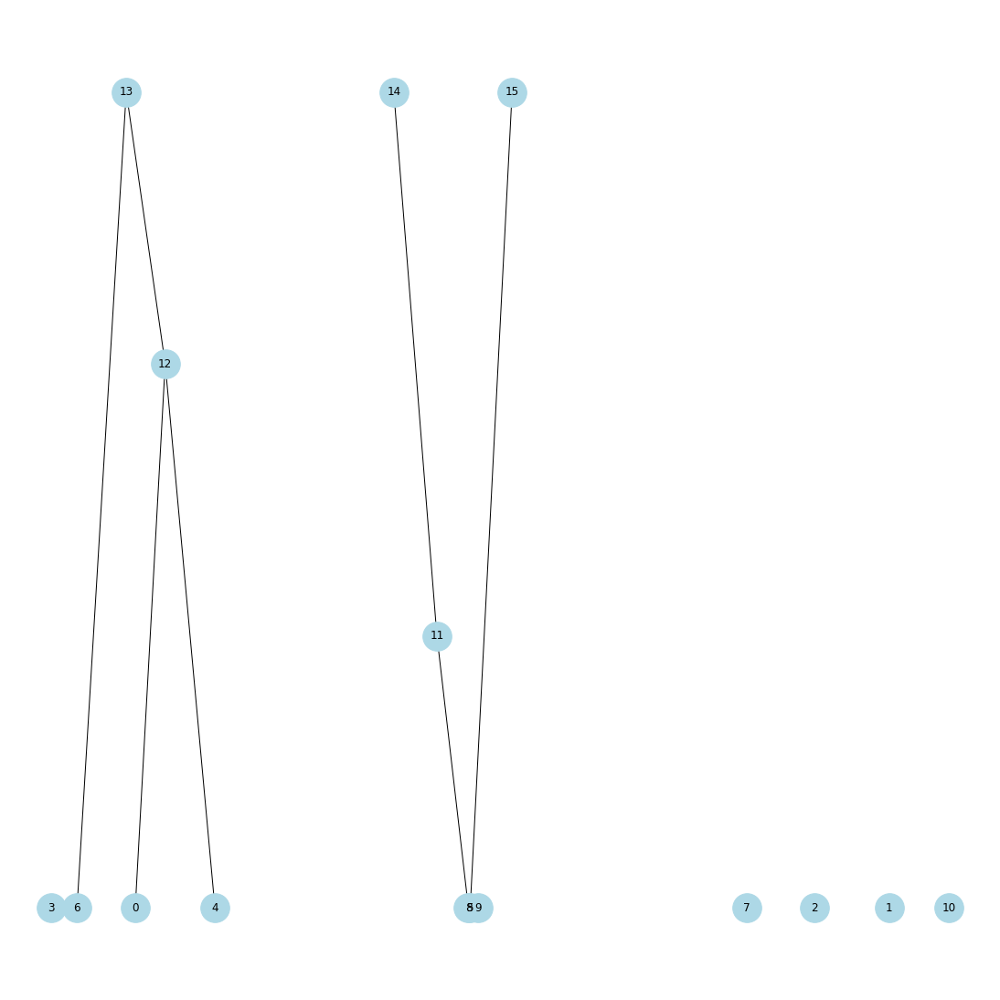

In [65]:
motifl.plot_motif_composition_graph()

## Downloading DNA sequence data

In [6]:


def download_dna_sequence(accession_number):
    # Set the URL to retrieve the DNA sequence data
    url = f"https://www.ncbi.nlm.nih.gov/sviewer/viewer.fcgi?id={accession_number}&report=fasta&retmode=text&withmarkup=on"

    # Send a GET request to the URL
    response = requests.get(url)

    # Check if the request was successful
    if response.status_code == 200:
        # Extract the DNA sequence from the response text
        sequence = ""
        lines = response.text.split("\n")
        for line in lines:
            if not line.startswith(">"):
                sequence += line.strip()

        # Limit the sequence length to 1000 base pairs
        sequence = sequence[7000:8000]

        # Return the DNA sequence
        return sequence

accession_number = "NC_000913.3"  # Accession number for Escherichia coli str. K-12 substr. MG1655
dna_sequence = download_dna_sequence(accession_number)
print(dna_sequence)

AGTAATATCAGCATGGCGCTTGCCGTACAGATGACCAGGGTGTCGATAAAAATGCCAATCATCTGGACAATCCCTTGCGCTGCCGGATGCGGAGGCCAGGACGCCGCTGCCGCTGCCGCGTTTGGCGTCGAACCCATTCCCGCCTCATTGGAAAACATACTGCGCTGAAAACCGTTAGTAATCGCCTGGCTTAAGGTATATCCCGCCGCGCCGCCTGCCGCTTCCTGCCAGCCAAAAGCACTCTCAAAAATAGACCAAATGACGTGGGGAAGTTGCCCGATATTCATTACGCAAATTACCAGGCTGGTCAGTACCCAGATTATCGCCATCAACGGGACAAAGCCCTGCATGAGCCGGGCGACGCCATGAAGACCGCGAGTGATTGCCAGCAGAGTAAAGACAGCGAGAATAATGCCTGTCACCAGCGGGGGAAAATCAAAAGAAAAACTCAGGGCGCGGGCAACGGCGTTCGCTTGAACTCCGCTGAAAATTATGCCATAGGCGATGAGCAAAAAGACGGCGAACAGAACGCCCATCCAGCGCATCCCCAGCCCGCGCGCCATATACCATGCCGGTCCGCCACGAAACTGCCCATTGACGTCACGTTCTTTATAAAGTTGTGCCAGAGAACATTCGGCAAACGAGGTCGCCATGCCGATAAACGCGGCAACCCACATCCAAAAGACGGCTCCAGGTCCACCGGCGGTAATAGCCAGCGCAACGCCGGCCAGGTTGCCGCTACCCACGCGCGCCGCAAGACTGGTACACAATGACTGAAATGAGGTTAAACCGCCTGGCTGTGGATGAATGCTATTTTTAAGACTTTTGCCAAACTGGCGGATGTAGCGAAACTGCACAAATCCGGTGCGAAAAGTGAACCAACAACCTGCGCCGAAGAGCAGGTAAATCATTACCGATCCCCAAAGGACGCTGTTAATGAAGGAGAAAAAATCTGGCATGCATATCCCTCTTATTGCCGGTCGCGATGACTTTCCTGTGT

### Pre-processing

In [7]:
transl = {'A':0, 'G':1, 'C':2, 'T':3}
inv_transl = {v:k for k, v in transl.items()}
dataset = [transl[i] for i in dna_sequence]

## Motif learning

In [8]:
motifl = MotifLearner(sim_thresh=1, freq_thresh=5, l_motif_range=[4,10])
motifl.fit(dataset)
motif_list = motifl.get_motifs()
for motif in motif_list:
    print("".join([inv_transl[i] for i in motif]))

/Users/aksheykumar/miniforge3/envs/tf_m1/lib/python3.8/site-packages/scipy/sparse/_index.py:125: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


CAGC
GGCG
GCGC
CGCT
TGCC
GCCG
CCAG
AAAA
GCCA
CTGG
TTGC
ATGC
CGCC
CCGC
CGCG
CCAT
AAAC
CTGC
TGAA
AATC
CAAA
AAAT
AGAC
GACG
ACGC
GCTG
AAAG
ATGA
GCGA
CAGG
CCCA
ATCC
GAAA
CGGC
CCGG
CCAA
CAAC
CGAA
AAGA
CCTG
TGCCG
AAGAC
GAAAA
CTGCC
CGCTG


## Visualising motifs with interactive plot

In [9]:
motifl.matrix_plot()

interactive(children=(IntSlider(value=7, description='l_motif', max=10, min=4), Output()), _dom_classes=('widg…

## Analysis of how the motifs compose, and pruning

In [10]:
motif_comp_mtx, pruned_motif_list = motifl.motif_composition_analysis()

/Users/aksheykumar/Desktop/motif-learning/examples/../motif_learning/motif_learning.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(60, 3))


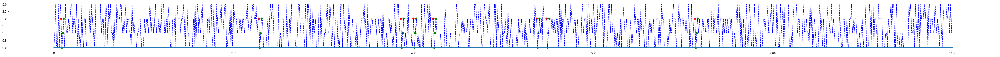

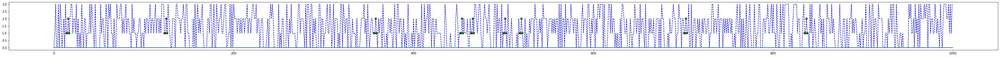

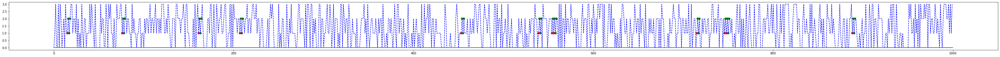

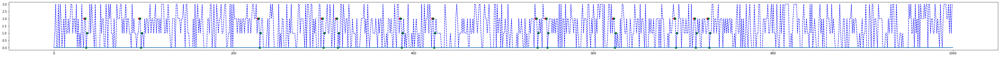

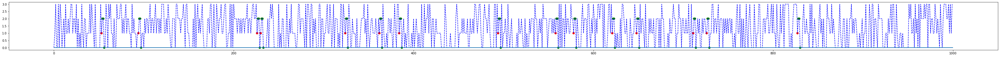

...

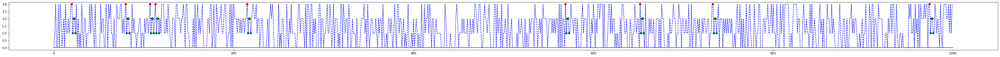

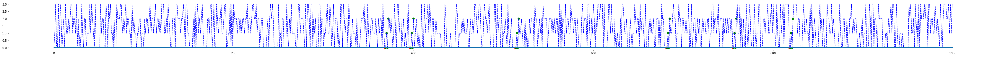

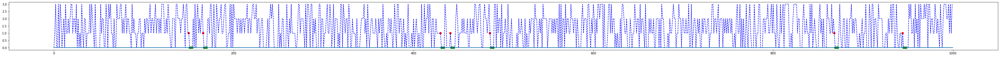

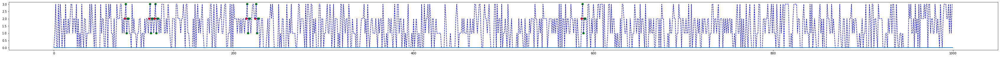

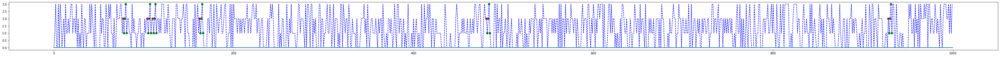

In [11]:
motifl.plot_motif_appearances(pruned=True)

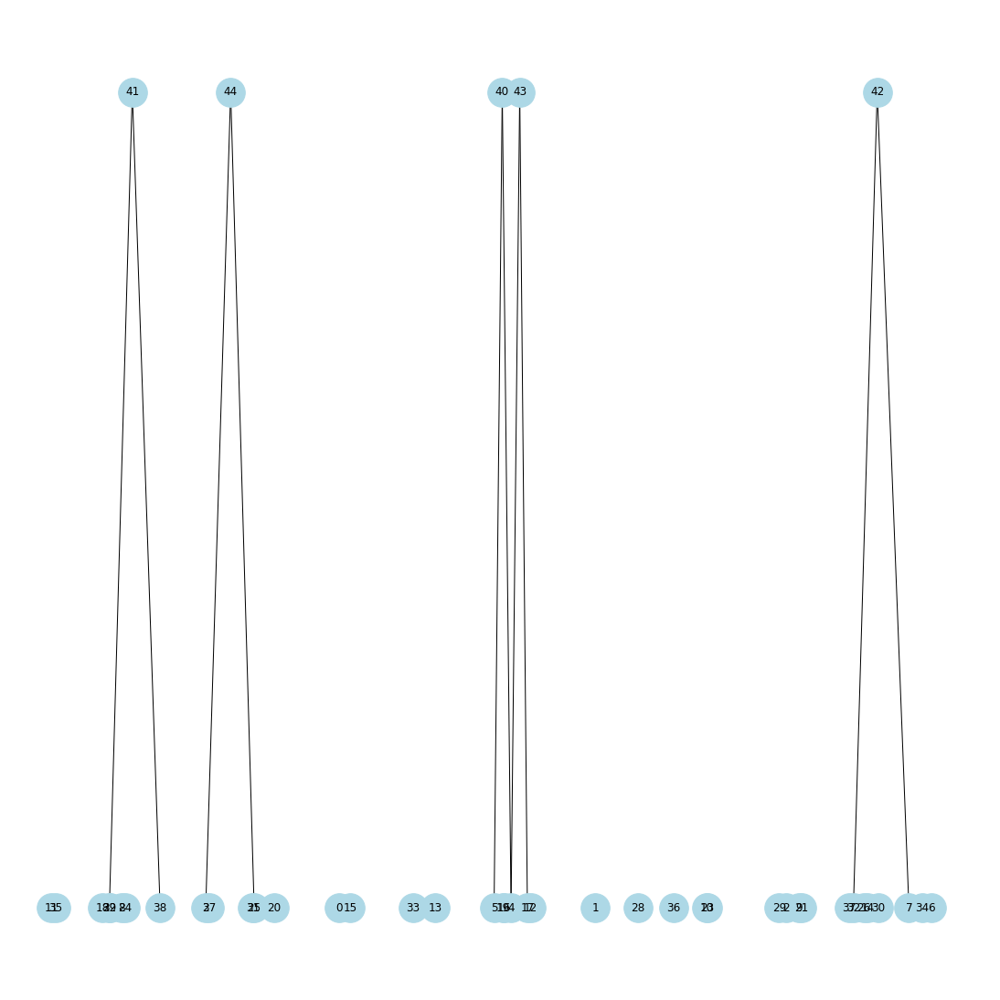

In [12]:
motifl.plot_motif_composition_graph()

In [ ]:
## Downloading DNA sequence data



def download_dna_sequence(accession_number):
    # Set the URL to retrieve the DNA sequence data
    url = f"https://www.ncbi.nlm.nih.gov/sviewer/viewer.fcgi?id={accession_number}&report=fasta&retmode=text&withmarkup=on"

    # Send a GET request to the URL
    response = requests.get(url)

    # Check if the request was successful
    if response.status_code == 200:
        # Extract the DNA sequence from the response text
        sequence = ""
        lines = response.text.split("\n")
        for line in lines:
            if not line.startswith(">"):
                sequence += line.strip()

        # Limit the sequence length to 1000 base pairs
        sequence = sequence[7000:8000]

        # Return the DNA sequence
        return sequence

accession_number = "NC_000913.3"  # Accession number for Escherichia coli str. K-12 substr. MG1655
dna_sequence = download_dna_sequence(accession_number)
print(dna_sequence)

### Pre-processing

transl = {'A':0, 'G':1, 'C':2, 'T':3}
inv_transl = {v:k for k, v in transl.items()}
dataset = [transl[i] for i in dna_sequence]

## Motif learning

motifl = MotifLearner(sim_thresh=1, freq_thresh=5, l_motif_range=[4,10])
motifl.fit(dataset)
motif_list = motifl.get_motifs()
for motif in motif_list:
    print("".join([inv_transl[i] for i in motif]))

## Visualising motifs with interactive plot

motifl.matrix_plot()

## Analysis of how the motifs compose, and pruning

motif_comp_mtx, pruned_motif_list = motifl.motif_composition_analysis()

motifl.plot_motif_appearances(pruned=True)

motifl.plot_motif_composition_graph()